In [ ]:
#| default_exp calibrate

# Calibration Routines

:::{.callout-tip}

This module can be imported using `from openhsi.calibrate import *`

:::

In [ ]:
#| hide

# documentation extraction for class methods
from nbdev.showdoc import *

# unit tests using test_eq(...)
from fastcore.test import *

# monkey patching class methods using @patch
from fastcore.foundation import *
from fastcore.foundation import patch

# imitation of Julia's multiple dispatch using @typedispatch
from fastcore.dispatch import typedispatch

# bring forth **kwargs from an inherited class for documentation
from fastcore.meta import delegates

In [ ]:
#| export
#| hide

from fastcore.foundation import patch
from fastcore.meta import delegates
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy.interpolate import interp1d
from PIL import Image
from scipy.signal import decimate, medfilt
import holoviews as hv
hv.extension('bokeh',logo=False)

from fastprogress.fastprogress import master_bar, progress_bar

from scipy.signal import find_peaks, savgol_filter
from scipy.optimize import curve_fit
from scipy import interpolate
from functools import reduce

from typing import Iterable, Union, Callable, List, TypeVar, Generic, Tuple, Optional, Dict
import datetime
import json
import pickle

In [ ]:
#| export

from openhsi.data import *
from openhsi.capture import *
from openhsi.cameras import *

In [ ]:
#| export

HgAr_lines = np.array([404.656,407.783,435.833,546.074,576.960,579.066,696.543,706.722,727.294,738.393,
                           750.387,763.511,772.376,794.818,800.616,811.531,826.452,842.465,912.297])

In [ ]:
#| export

def sum_gaussians(x:np.array, # indicies
                  *args, # "amplitude, peak position, peak width, constant"
                 ) -> np.array: # summed Gaussian curves array
    """Compute the summed Gaussians given the array indicies `x` and mushed arguments of amplitude, peak position, peak width, constant"""
    split = len(args)//3
    A   = args[0:split]         # amplitude
    mu  = args[split:2*split]   # peak position
    sigma = args[split*2:-1]    # peak stdev
    c   = args[-1]              # offset
    return np.array( [A[i] * np.exp( - np.square( (x - mu[i])/sigma[i] ) ) 
                        for i in range(len(A))] ).sum(axis=0) + c

In [ ]:
#| export

class SettingsBuilderMixin():
        
    def retake_flat_field(self,
                          show:bool = True, # flag to show taken image
                         ) -> hv.Image:
        """Take and store an image of with the OpenHSI slit illuminated but a uniform light source."""
        self.start_cam()
        self.calibration["flat_field_pic"] = self.get_img()
        self.stop_cam()
        
        if show:
            return hv.Image(self.calibration["flat_field_pic"], bounds=(0,0,*self.calibration["flat_field_pic"].shape)).opts(
                    xlabel="wavelength index",ylabel="cross-track",cmap="gray",title="flat field picture")
    
    def retake_emission_lines(self,
                              show:bool = True, # flag to show
                              nframes:int = 10, # number of frames to average for image
                             ) -> hv.Image:
        """Take and store an image with camera illuminated with a calibration source."""
        self.calibration["HgAr_pic"] = self.avgNimgs(nframes)
       
        if show:
            return hv.Image(self.crop(self.calibration["HgAr_pic"]), bounds=(0,0,*self.calibration["HgAr_pic"].shape)).opts(
                    xlabel="wavelength index",ylabel="cross-track",cmap="gray",title="Emission lines picture")

    def retake_HgAr(self,
                    show:bool = True, # flag to show
                    nframes:int = 10, # number of frames to average for image
                   ) -> hv.Image:
        """Take and store an image with OpenHSI camera illuminated with a HgAr calibration source."""
        self.calibration["HgAr_pic"] = self.avgNimgs(nframes)
       
        if show:
            return hv.Image(self.crop(self.calibration["HgAr_pic"]), bounds=(0,0,*self.calibration["HgAr_pic"].shape)).opts(
                    xlabel="wavelength index",ylabel="cross-track",cmap="gray",title="HgAr spectra picture")
        
    
    def update_resolution(self) -> None:
        """Set settings resolution to match flat field image"""
        self.settings["resolution"] = np.shape(self.calibration["flat_field_pic"])
    
    def update_row_minmax(self, 
                          edgezone:int = 4, # number of pixel buffer to add to crop region
                          show:bool = True, # flag to show plot of slice and edges identified
                         ) -> hv.Curve:
        """Find edges of slit in flat field images and determine region to crop."""
        col_summed = np.sum(self.calibration["flat_field_pic"],axis=1)
        edges      = np.abs(np.gradient(col_summed))
        locs       = find_peaks(edges, height=5000, width=1.5, prominence=0.01)[0]
        print("Locs row_min: {} and row_max: {}".format(locs[0],locs[1]))
        row_min  = int(locs[0]+edgezone) # shift away from the edges a little to make sure we are in well lit region
        row_max = int(locs[-1]-edgezone)
        num   = len(col_summed)
        big   = np.max(col_summed)
        self.settings["row_slice"] = (row_min,row_max)
        if show:
            return (hv.Curve(zip(np.arange(num),col_summed)).opts(xlabel="row index",ylabel="count",width=500) * \
                    hv.Curve(zip((row_min,row_min),(0,big)),label=f"{row_min}").opts(color="r") * \
                    hv.Curve(zip((row_max,row_max),(0,big)),label=f"{row_max}").opts(color="r") ).opts(
                    xlim=(0,num),ylim=(0,big),legend_position='top_left')
        
    def update_smile_shifts(self, 
                            show=True, # flag to show plot of smile shifts for each cross track pixel.
                           ) -> hv.Curve:
        """Determine Smile and shifts to correct from spectral lines image."""
        cropped = self.crop(self.calibration["HgAr_pic"])
        rows, cols = cropped.shape

        window = np.int32(np.flip(cropped[rows//2,:].copy()))

        shifts = np.zeros((rows,),dtype=np.int16)

        for i in range(rows):
            pattern_match = np.convolve(cropped[i,:],window,"same")
            shifts[i] = np.argmax(pattern_match)

        shifts -= cols//2
        shifts -= np.min(shifts) # make all entries positive
        shifts = medfilt(shifts,5).astype(np.int16) # use some median smoothing
        self.calibration["smile_shifts"] = shifts
        if show:
            return hv.Curve(zip(np.arange(rows),shifts)).opts(
                            invert_axes=True,invert_yaxis=True,xlabel="row index",ylabel="pixel shift")
        
    def fit_emission_lines(self,
                           brightest_peaks:list, # list of wavelength for the brightest peaks in spectral lines image
                           emission_lines:list,  # list of emission lines to match
                           top_k:int = 10,       # how many peaks to use in fit
                           filter_window:int = 1,       # filter window for scipy.signal.savgol_filter. Needs to be odd.
                           interactive_peak_id:bool = False, # flag to interactively confirm wavelength of peaks
                           find_peaks_height:int = 10,  # anything above this value is free game for a peak
                           prominence:float = 0.2,      # prominence for scipy.signal.find_peaks
                           width:float = 1.5,           # peak width for scipy.signal.find_peaks
                           distance:int = 10,           # distance for scipy.signal.find_peaks
                           max_match_error:float = 2.0, # max diff between peak estimate wavelength and wavelength from line list
                           verbose:bool = False,        # more detailed diagnostic messages
                          ) -> hv.Curve:
        """Finds the index to wavelength map given a spectra and a list of emission lines. 
        To filter the spectra, set `filter_window` to an odd number > 1."""

        cropped      = self.crop(self.calibration["HgAr_pic"])
        rows, cols   = cropped.shape
        spectra      = cropped[rows//2,self.calibration["smile_shifts"][rows//2]:].copy()
        _start_idx   = self.calibration["smile_shifts"][rows//2] # get smile shifted indexes
        _num_idx     = self.settings["resolution"][1]-np.max(self.calibration["smile_shifts"]) # how many pixels kept per row
        shifted_idxs = np.arange(self.settings["resolution"][1])[_start_idx:_start_idx+_num_idx]

        filtered_spec = savgol_filter(spectra, filter_window, min(3,filter_window-1))
        μ, props      = find_peaks(filtered_spec, 
                                   height     = find_peaks_height, 
                                   width      = width, 
                                   prominence = prominence, 
                                   distance   = distance)
        
        A = props["peak_heights"] # amplitude
        σ = 0.5 * props["widths"] # standard deviation
        c = 0                     # constant
        params0 = [*A,*μ,*σ,c]    # flatten to 1D array

        # refine the estimates from find_peaks by curve fitting Gaussians
        coeffs, _ = curve_fit(sum_gaussians, np.arange(len(spectra)), spectra, p0=params0)
        split = len(params0)//3
        A = coeffs[:split]
        μ = coeffs[split:2*split]
        σ = coeffs[2*split:-1]

        plt.subplots(figsize=(15,3))
        plt.plot(filtered_spec,"b-",label="filtered spectra")
        plt.plot(sum_gaussians(np.arange(len(spectra)),*coeffs),"r:",label="curve fit")
        plt.legend(); plt.xlabel("array index"); plt.ylabel("digital number")
        plt.show()

        # interactivly confirm peak wavelengths
        top_A_idx = np.flip(np.argsort(A))[:len(brightest_peaks)]
        if interactive_peak_id:
            plt.plot(np.arange(len(spectra)), spectra)
            plt.plot(μ[top_A_idx], A[top_A_idx], "rx")
            plt.show()
            for i, pk in enumerate(top_A_idx.tolist()):
                print(f"Peak {i} at col {μ[pk]} - default wavelength {brightest_peaks[i]}:")
                res = input()
                if res:
                    brightest_peaks[i]=float(res)

            if verbose: print(f"top_A_idx={top_A_idx}\nA[top_A_idx]={A[top_A_idx]}\nμ[top_A_idx]={μ[top_A_idx]}\nσ[top_A_idx]={σ[top_A_idx]}\nbrightest_peaks={brightest_peaks}")

        # interpolate with brightest spectral lines
        first_fit = np.poly1d( np.polyfit(μ[top_A_idx],brightest_peaks,1) )
        predicted_λ = first_fit(μ)
        if verbose: print(f"Predicted λ {predicted_λ} for column {μ}")
        
        plt.plot(μ[top_A_idx], brightest_peaks, "xr")
        plt.plot(np.arange(len(spectra)), first_fit(np.arange(len(spectra))))
        plt.legend(['Identified Peaks', 'Spectra']); plt.xlabel("array index"); plt.ylabel("predicted wavelength (nm)")
        plt.show()
        
        # match estimated peak wavelength with real line for final fit, verify match is better than max_match_error.
        closest_HgAr_line, matching_centroid, matching_A  = [], [], []
        diffs = [np.min(np.abs(HgAr_lines-λ)) for λ in predicted_λ]
        for i in range(len(diffs)):
            if verbose: print(f"difference HgAr_lines - λ = {diffs[i]}")
            if diffs[i] < max_match_error: # nm
                closest_HgAr_line.append( HgAr_lines[np.argmin(np.abs(HgAr_lines - predicted_λ[i]))] )
                matching_centroid.append( μ[i] )
                matching_A.append( A[i] )
                
        # convert to numpy array
        closest_HgAr_line = np.asarray(closest_HgAr_line)
        matching_centroid = np.asarray(matching_centroid)
        matching_A        = np.asarray(matching_A)
        
        # preform final fit of wavelength with paired lines and peaks.        
        top_A_idx = np.flip(np.argsort(matching_A))[:max(min(top_k, len(closest_HgAr_line)),4)]
        final_fit = np.poly1d(np.polyfit(matching_centroid[top_A_idx], closest_HgAr_line[top_A_idx] ,3) )
        spec_wavelengths = final_fit(matching_centroid[top_A_idx])
        
        plt.plot(matching_centroid[top_A_idx], closest_HgAr_line[top_A_idx], "xr")
        plt.plot(np.arange(len(spectra)), final_fit(np.arange(len(spectra))))
        plt.legend(['Identified Peaks', 'Spectra']); plt.xlabel("array index"); plt.ylabel("predicted wavelength (nm)")
        plt.show()

        # update the calibration files
        self.calibration["wavelengths"] = final_fit(shifted_idxs)
        linear_fit = np.poly1d( np.polyfit(matching_centroid[top_A_idx], closest_HgAr_line[top_A_idx] ,1) )
        self.calibration["wavelengths_linear"] = linear_fit(shifted_idxs)

        # create plot of fitted spectral lines
        plots_list = [hv.Curve( zip(final_fit(np.arange(len(spectra))),spectra) )]
        for λ in spec_wavelengths:
            plots_list.append( hv.Curve(zip((λ,λ),(0,np.max(spectra))),).opts(color="r",alpha=0.5) )

        return reduce((lambda x, y: x * y), plots_list).opts(
                    xlim=(final_fit(0),final_fit(len(spectra))),ylim=(0,np.max(spectra)),
                    xlabel="wavelength (nm)",ylabel="digital number",width=700,height=200,toolbar="below")

    
    def fit_HgAr_lines(self, 
                       brightest_peaks:list = [435.833,546.074,763.511], # list of wavelength for the brightest peaks in spectral lines image
                       top_k:int = 10,              # how many peaks to use in fit
                       filter_window:int = 1,       # filter window for scipy.signal.savgol_filter. Needs to be odd.
                       interactive_peak_id:bool = False, # flag to interactively confirm wavelength of peaks
                       find_peaks_height:int = 10,  # anything above this value is free game for a peak
                       prominence:float = 0.2,      # prominence for scipy.signal.find_peaks
                       width:float = 1.5,           # peak width for scipy.signal.find_peaks
                       distance:int = 10,           # distance for scipy.signal.find_peaks
                       max_match_error:float = 2.0, # max diff between peak estimate wavelength and wavelength from line list
                       verbose:bool = False,        # more detailed diagnostic messages
                      ) -> hv.Curve:
        """Finds the index to wavelength map given a spectra and a list of emission lines. 
        To filter the spectra, set `filter_window` to an odd number > 1."""
        
        return self.fit_emission_lines(brightest_peaks = brightest_peaks,
                                       emission_lines  = HgAr_lines,
                                       top_k = top_k,
                                       filter_window   = filter_window,
                                       interactive_peak_id = interactive_peak_id,
                                       find_peaks_height = find_peaks_height,
                                       prominence      = prominence,
                                       width           = width,
                                       distance        = distance,
                                       max_match_error = max_match_error,
                                       verbose         = verbose)

    
    def update_intsphere_fit(self,
                             spec_rad_ref_data:str = "../assets/112704-1-1_1nm_data.csv", # path to integrating sphere cal file
                             spec_rad_ref_luminance:int = 52_020,                      # reference luminance for integrating sphere
                             show:bool = True,                                         # flag to show plot
                            ) -> hv.Curve:

        cal_data=np.genfromtxt(spec_rad_ref_data, delimiter=',', skip_header=1)
        wavelen=cal_data[:,0]
        spec_rad=cal_data[:,1]
        
        self.calibration['spec_rad_ref_luminance'] = spec_rad_ref_luminance

        self.calibration["sfit"] = interp1d(wavelen, spec_rad, kind='cubic')
        
        if show:
            wavelen_arr = np.linspace(np.min(wavelen),np.max(wavelen),num=200)
            spec_rad_ref = np.float64(self.calibration["sfit"](self.calibration["wavelengths"]))

            fig, ax = plt.subplots(figsize=(12,4))
            ax.plot(wavelen,spec_rad,"r.",label="Manufacturer Calibration Points")
            ax.plot(wavelen_arr,self.calibration["sfit"](wavelen_arr),label="Spline Fit")
            ax.grid("on")
            #plt.axis([393,827,0,200])
            ax.set_xlabel("wavelength (nm)")
            ax.set_ylabel("spectral radiance ($\mu$W/cm$^2$/sr/nm)")
            ax.legend()
            ax.axvspan(np.min(self.calibration["wavelengths"]), np.max(self.calibration["wavelengths"]), alpha=0.3, color="gray")
            ax.axis([np.min(self.calibration["wavelengths"])-50,2500,0,200])
            #ax.text(410, 190, "OpenHSI Wavelengths", fontsize=11)
            ax.minorticks_on()
            return fig
    

    def update_window_across_track(self, crop_buffer) -> hv.Curve:
        """not implemented"""
        pass
    
    def update_window_along_track(self, crop_buffer) -> hv.Curve:
        """not implemented"""
        pass

    def update_intsphere_cube(self,
                              exposures:List,   # exposure times for the camera to iterate over
                              luminances:List,  # luminance values for the integrating sphere to iterate over
                              nframes:int = 10, # how many frames to average over
                              lum_chg_func:Callable = print, # called on each luminance value before collection starts
                              interactive:bool = False, # if you want to manually press enter each luminance iteration
                              ):
        shape = (np.ptp(self.settings["row_slice"]), self.settings["resolution"][1], len(exposures), len(luminances))

        lum_buff = CircArrayBuffer(shape[:3], axis=2, dtype=np.int32)
        rad_ref  = CircArrayBuffer(shape, axis=3, dtype=np.int32)
        
        mb = master_bar(range(len(luminances)))
        for i in mb:
            mb.main_bar.comment = f"Luminance = {luminances[i]} Cd/m^2"
            if interactive: input(f"\rLuminance = {luminances[i]} Cd/m^2. Press enter key when ready...")
            
            if luminances[i] == 0:
                input(f"\rLuminance = 0 Cd/m^2. Place lens cap on and press enter to continue.")
            else:
                lum_chg_func(luminances[i])
                
            for j in progress_bar(range(len(exposures)), parent=mb):
                mb.child.comment = f"exposure = {exposures[j]} ms"
                self.set_exposure(exposures[j])
                exposures[j] = self.settings["exposure_ms"]  # store real exposure time
                lum_buff.put( self.crop( self.avgNimgs(nframes) ) )

            rad_ref.put( lum_buff.data )
            mb.write(f"Finished collecting at luminance {luminances[i]} Cd/m^2.")
            if luminances[i] == 0:
                input(f"\rLuminance = 0 Cd/m^2. Remove lens cap and place on int sphere and press enter to continue.")
                
        return xr.Dataset(data_vars=dict(datacube=(["cross_track","wavelength_index","exposure","luminance"],rad_ref.data)),
                                                 coords=dict(cross_track=(["cross_track"],np.arange(shape[0])),
                                                          wavelength_index=(["wavelength_index"],np.arange(shape[1])),
                                                          exposure=(["exposure"],exposures),
                                                          luminance=(["luminance"],luminances)), attrs={}).datacube

In [ ]:
#| export

class SettingsBuilderMetaclass(type):
    def __new__(cls, clsname:str, cam_class, attrs) -> type: #"SettingsBuilder Class":
        """Create a SettingsBuilder class based on your chosen `CameraClass`."""
        return super(SettingsBuilderMetaclass, cls).__new__(cls, clsname, (cam_class,SettingsBuilderMixin), attrs)
    

def create_settings_builder(clsname:str, 
                            cam_class:type, # Camera Class
                           ) -> type: # "SettingsBuilder Class"
    """Create a `SettingsBuilder` class called `clsname` based on your chosen `cam_class`."""
    return type(clsname, (cam_class,SettingsBuilderMixin), {})
    
    

### Using the SettingsBuilderMixin

There are a few ways to create a SettingsBuilder class that words for your custom camera. (They involve Python metaclasses and mixins)

For example, you can then create a SettingsBuilder class that works for your custom camera by doing one of the following.

:::{.callout-note}

Below we use the 'SimulatedCamera' class. When calibrating a real camera you would replace `SimulatedCamera` with your camera class.

:::

In [ ]:
# using helper function
SettingsBuilder = create_settings_builder("SettingsBuilder",SimulatedCamera)

# using Metaclasses
SettingsBuilder = SettingsBuilderMetaclass("SettingsBuilder",SimulatedCamera,{})

# initialising
sb = SettingsBuilder(json_path="../assets/cam_settings.json", 
                     cal_path="../assets/cam_calibration.nc")

Allocated 17.48 MB of RAM. There was 1463.06 MB available.


In [ ]:
# pure mixin
class CalibrateOpenHSI(SettingsBuilderMixin, SimulatedCamera):
    pass

sb = CalibrateOpenHSI(mode="flat",json_path="../assets/cam_settings.json", cal_path="../assets/cam_calibration.nc")

Allocated 17.48 MB of RAM. There was 1450.69 MB available.


## Find illuminated sensor area

We assume the x axis (or detector columns) are used for the spectral channels, the rows correspond to the cross-track dimension and are limited by the optics (slit). The useable area is cropped out (windowing can also be used to reduce data intake).

In [ ]:
show_doc(SettingsBuilderMixin.retake_flat_field)

---

[source](https://github.com/openhsi/openhsi/blob/master/openhsi/calibrate.py#L57){target="_blank" style="float:right; font-size:smaller"}

### SettingsBuilderMixin.retake_flat_field

>      SettingsBuilderMixin.retake_flat_field (show:bool=True)

*Take and store an image of with the OpenHSI slit illuminated but a uniform light source.*

|    | **Type** | **Default** | **Details** |
| -- | -------- | ----------- | ----------- |
| show | bool | True | flag to show taken image |
| **Returns** | **Image** |  |  |

In [ ]:
show_doc(SettingsBuilderMixin.update_row_minmax)

---

[source](https://github.com/openhsi/openhsi/blob/master/openhsi/calibrate.py#L96){target="_blank" style="float:right; font-size:smaller"}

### SettingsBuilderMixin.update_row_minmax

>      SettingsBuilderMixin.update_row_minmax (edgezone:int=4, show:bool=True)

*Find edges of slit in flat field images and determine region to crop.*

|    | **Type** | **Default** | **Details** |
| -- | -------- | ----------- | ----------- |
| edgezone | int | 4 | number of pixel buffer to add to crop region |
| show | bool | True | flag to show plot of slice and edges identified |
| **Returns** | **Curve** |  |  |

In [ ]:
hvimg=sb.retake_flat_field(show=True)
hvimg.opts(width=400,height=400)
print(sb.calibration["flat_field_pic"].max())
hvimg

255


:Image   [x,y]   (z)

In [ ]:
sb.update_row_minmax()

Locs row_min: 7 and row_max: 912


:Overlay
   .Curve.I     :Curve   [x]   (y)
   .Curve.A_11  :Curve   [x]   (y)
   .Curve.A_908 :Curve   [x]   (y)

In [ ]:
sb.update_resolution()

## Smile Correction

The emissions lines, which should be straight vertical, appear slightly curved. This is smile error (error in the spectral dimension). 

In [ ]:

sb.mode_change("HgAr")

In [ ]:
show_doc(SettingsBuilderMixin.retake_emission_lines)

---

[source](https://github.com/openhsi/openhsi/blob/master/openhsi/calibrate.py#L69){target="_blank" style="float:right; font-size:smaller"}

### SettingsBuilderMixin.retake_emission_lines

>      SettingsBuilderMixin.retake_emission_lines (show:bool=True,
>                                                  nframes:int=10)

*Take and store an image with camera illuminated with a calibration source.*

|    | **Type** | **Default** | **Details** |
| -- | -------- | ----------- | ----------- |
| show | bool | True | flag to show |
| nframes | int | 10 | number of frames to average for image |
| **Returns** | **Image** |  |  |

In [ ]:
show_doc(SettingsBuilderMixin.retake_HgAr)

---

[source](https://github.com/openhsi/openhsi/blob/master/openhsi/calibrate.py#L80){target="_blank" style="float:right; font-size:smaller"}

### SettingsBuilderMixin.retake_HgAr

>      SettingsBuilderMixin.retake_HgAr (show:bool=True, nframes:int=10)

*Take and store an image with OpenHSI camera illuminated with a HgAr calibration source.*

|    | **Type** | **Default** | **Details** |
| -- | -------- | ----------- | ----------- |
| show | bool | True | flag to show |
| nframes | int | 10 | number of frames to average for image |
| **Returns** | **Image** |  |  |

In [ ]:
show_doc(SettingsBuilderMixin.update_smile_shifts)

---

[source](https://github.com/openhsi/openhsi/blob/master/openhsi/calibrate.py#L116){target="_blank" style="float:right; font-size:smaller"}

### SettingsBuilderMixin.update_smile_shifts

>      SettingsBuilderMixin.update_smile_shifts (show=True)

*Determine Smile and shifts to correct from spectral lines image.*

|    | **Type** | **Default** | **Details** |
| -- | -------- | ----------- | ----------- |
| show | bool | True | flag to show plot of smile shifts for each cross track pixel. |
| **Returns** | **Curve** |  |  |

In [ ]:

hvimg=sb.retake_HgAr(show=True, nframes=1)
hvimg.opts(width=400,height=400)
print(sb.calibration["HgAr_pic"].max())
hvimg

255.0


:Image   [x,y]   (z)

In [ ]:
sb.update_smile_shifts()

:Curve   [x]   (y)

## Map the spectral axis to wavelengths

To do this, peaks in the HgAr spectrum are found, refined by curve-fitting with Gaussians. The location of the peaks then allow for interpolation to get the map from array (column) index to wavelength (nm).

In [ ]:
show_doc(SettingsBuilderMixin.fit_emission_lines)

---

[source](https://github.com/openhsi/openhsi/blob/master/openhsi/calibrate.py#L139){target="_blank" style="float:right; font-size:smaller"}

### SettingsBuilderMixin.fit_emission_lines

>      SettingsBuilderMixin.fit_emission_lines (brightest_peaks:list,
>                                               emission_lines:list,
>                                               top_k:int=10,
>                                               filter_window:int=1,
>                                               interactive_peak_id:bool=False,
>                                               find_peaks_height:int=10,
>                                               prominence:float=0.2,
>                                               width:float=1.5,
>                                               distance:int=10,
>                                               max_match_error:float=2.0,
>                                               verbose:bool=False)

*Finds the index to wavelength map given a spectra and a list of emission lines. 
To filter the spectra, set `filter_window` to an odd number > 1.*

|    | **Type** | **Default** | **Details** |
| -- | -------- | ----------- | ----------- |
| brightest_peaks | list |  | list of wavelength for the brightest peaks in spectral lines image |
| emission_lines | list |  | list of emission lines to match |
| top_k | int | 10 | how many peaks to use in fit |
| filter_window | int | 1 | filter window for scipy.signal.savgol_filter. Needs to be odd. |
| interactive_peak_id | bool | False | flag to interactively confirm wavelength of peaks |
| find_peaks_height | int | 10 | anything above this value is free game for a peak |
| prominence | float | 0.2 | prominence for scipy.signal.find_peaks |
| width | float | 1.5 | peak width for scipy.signal.find_peaks |
| distance | int | 10 | distance for scipy.signal.find_peaks |
| max_match_error | float | 2.0 | max diff between peak estimate wavelength and wavelength from line list |
| verbose | bool | False | more detailed diagnostic messages |
| **Returns** | **Curve** |  |  |

In [ ]:
show_doc(SettingsBuilderMixin.fit_HgAr_lines)

---

[source](https://github.com/openhsi/openhsi/blob/master/openhsi/calibrate.py#L251){target="_blank" style="float:right; font-size:smaller"}

### SettingsBuilderMixin.fit_HgAr_lines

>      SettingsBuilderMixin.fit_HgAr_lines (brightest_peaks:list=[435.833,
>                                           546.074, 763.511], top_k:int=10,
>                                           filter_window:int=1,
>                                           interactive_peak_id:bool=False,
>                                           find_peaks_height:int=10,
>                                           prominence:float=0.2,
>                                           width:float=1.5, distance:int=10,
>                                           max_match_error:float=2.0,
>                                           verbose:bool=False)

*Finds the index to wavelength map given a spectra and a list of emission lines. 
To filter the spectra, set `filter_window` to an odd number > 1.*

|    | **Type** | **Default** | **Details** |
| -- | -------- | ----------- | ----------- |
| brightest_peaks | list | [435.833, 546.074, 763.511] | list of wavelength for the brightest peaks in spectral lines image |
| top_k | int | 10 | how many peaks to use in fit |
| filter_window | int | 1 | filter window for scipy.signal.savgol_filter. Needs to be odd. |
| interactive_peak_id | bool | False | flag to interactively confirm wavelength of peaks |
| find_peaks_height | int | 10 | anything above this value is free game for a peak |
| prominence | float | 0.2 | prominence for scipy.signal.find_peaks |
| width | float | 1.5 | peak width for scipy.signal.find_peaks |
| distance | int | 10 | distance for scipy.signal.find_peaks |
| max_match_error | float | 2.0 | max diff between peak estimate wavelength and wavelength from line list |
| verbose | bool | False | more detailed diagnostic messages |
| **Returns** | **Curve** |  |  |

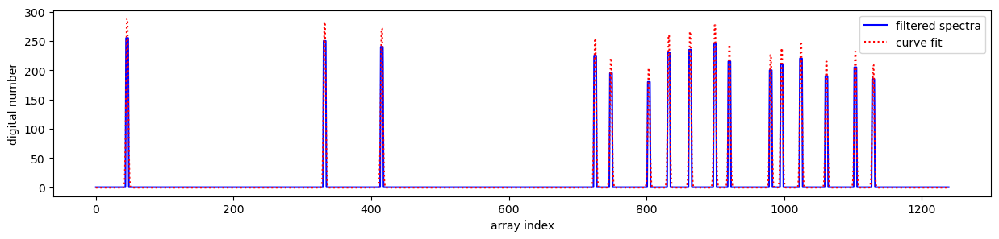

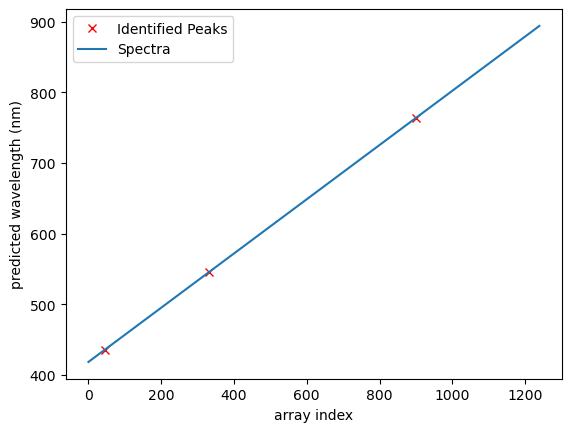

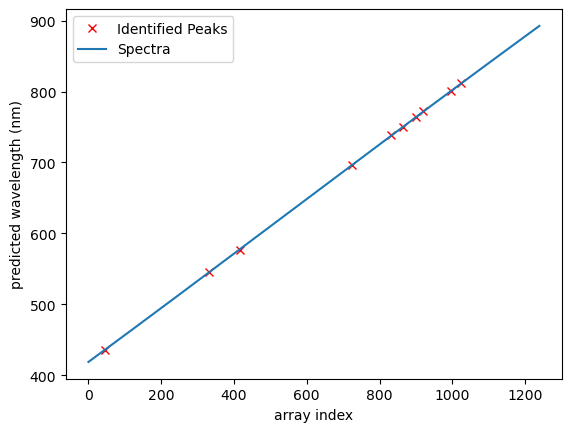

:Overlay
   .Curve.I    :Curve   [x]   (y)
   .Curve.II   :Curve   [x]   (y)
   .Curve.III  :Curve   [x]   (y)
   .Curve.IV   :Curve   [x]   (y)
   .Curve.V    :Curve   [x]   (y)
   .Curve.VI   :Curve   [x]   (y)
   .Curve.VII  :Curve   [x]   (y)
   .Curve.VIII :Curve   [x]   (y)
   .Curve.IX   :Curve   [x]   (y)
   .Curve.X    :Curve   [x]   (y)
   .Curve.XI   :Curve   [x]   (y)

In [ ]:

sb.fit_HgAr_lines(top_k=10)

Each column in our camera frame (after smile correction) corresponds to a particular wavelength. The interpolation between column index and wavelength is slightly nonlinear which is to be expected from the diffraction grating - however it is linear to good approximation. Applying a linear interpolation gives an absolute error of $\pm$3 nm whereas the a cubic interpolation used here gives an absolute error of $\pm$ 0.3 nm (approximately the spacing between each column). Using higher order polynomials doesn't improve the error due to overfitting.  

For fast real time processing, the fast binning procedure assumes a linear interpolation because the binning algorithm consists of a single broadcasted summation with no additional memory allocation overhead. A slower more accurate spectral binning procedure is also provided using the cubic interpolation described here and requires hundreds of temporary arrays to be allocated each time. Binning can also be done in post processing after collecting raw data. 

In [ ]:
show_doc(SettingsBuilderMixin.update_intsphere_fit)

---

[source](https://github.com/openhsi/openhsi/blob/master/openhsi/calibrate.py#L279){target="_blank" style="float:right; font-size:smaller"}

### SettingsBuilderMixin.update_intsphere_fit

>      SettingsBuilderMixin.update_intsphere_fit
>                                                 (spec_rad_ref_data:str='../ass
>                                                 ets/112704-1-1_1nm_data.csv', 
>                                                 spec_rad_ref_luminance:int=520
>                                                 20, show:bool=True)

|    | **Type** | **Default** | **Details** |
| -- | -------- | ----------- | ----------- |
| spec_rad_ref_data | str | ../assets/112704-1-1_1nm_data.csv | path to integrating sphere cal file |
| spec_rad_ref_luminance | int | 52020 | reference luminance for integrating sphere |
| show | bool | True | flag to show plot |
| **Returns** | **Curve** |  |  |

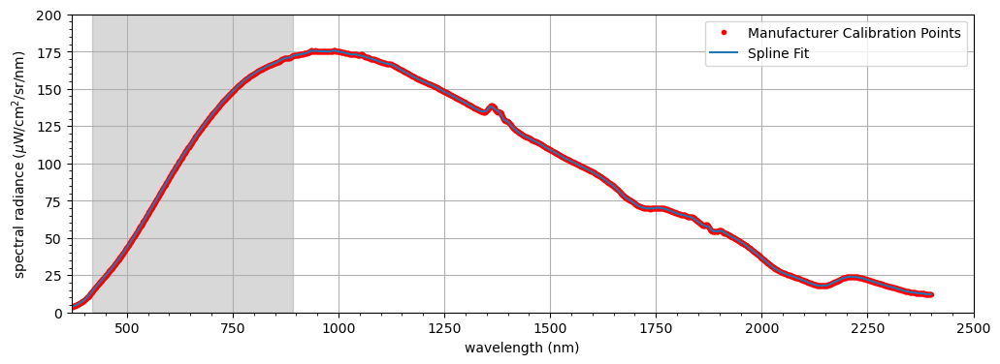

In [ ]:
#| hardware
fig = sb.update_intsphere_fit()
#sb.dump() # resave the settings and calibration files

## Integrating Sphere data

4D datacube with coordinates of cross-track, wavelength, exposure, and luminance.

:::{.callout-warning}

Needs testing!

:::

In [ ]:
show_doc(SettingsBuilderMixin.update_intsphere_cube)

---

[source](https://github.com/openhsi/openhsi/blob/master/openhsi/calibrate.py#L320){target="_blank" style="float:right; font-size:smaller"}

### SettingsBuilderMixin.update_intsphere_cube

>      SettingsBuilderMixin.update_intsphere_cube (exposures:List,
>                                                  luminances:List,
>                                                  nframes:int=10,
>                                                  lum_chg_func:Callable=<built-
>                                                  in function print>,
>                                                  interactive:bool=False)

|    | **Type** | **Default** | **Details** |
| -- | -------- | ----------- | ----------- |
| exposures | List |  | exposure times for the camera to iterate over |
| luminances | List |  | luminance values for the integrating sphere to iterate over |
| nframes | int | 10 | how many frames to average over |
| lum_chg_func | Callable | print | called on each luminance value before collection starts |
| interactive | bool | False | if you want to manually press enter each luminance iteration |

In [ ]:
#| hardware

luminances=[0, 1_000, 5_000, 10_000, 20_000, 40_000]
exposures = [0, 5, 8, 10, 15, 20]
sb.calibration["rad_ref"] = cam.update_intsphere_cube(exposures, luminances, noframe=50, lum_chg_func=spt.selectPreset)

# remove saturated images
cam.calibration["rad_ref"] = cam.calibration["rad_ref"].where(
    ~(np.sum((cam.calibration["rad_ref"][:, :, :, :, :] == 255), axis=(1, 2)) > 1000)
)


NameError: name 'cam' is not defined

When you are happy with the calibration, dump the updates.

In [ ]:
#| hardware

# save at the end
cam.dump(json_path=json_path_target, cal_path=cal_path_target)

### SpectraPT TCP Client
Class to interact with the Spectra PT integrating sphere.

In [ ]:
#| export

import collections
import math
import socket
import time

try:
    import winsound
except ImportError:
    def playAlert():
        pass
else:
    def playAlert():
        winsound.MessageBeep(type=winsound.MB_ICONHAND)

class SpectraPTController():
    def __init__(self, 
                 lum_preset_dict:Dict[int,int]={0:1, 1_000:2, 
                                                2_000:3, 3_000:4, 
                                                4_000:5, 5_000:6, 
                                                6_000:7, 7_000:8, 
                                                8_000:9, 9_000:10, 
                                                10_000:11, 20_000:12, 
                                                25_000:13, 30_000:14, 
                                                35_000:15, 40_000:16},
                 host:str="localhost", 
                 port:int=3434):
        self.lum_preset_dict=lum_preset_dict
        self.host=host
        self.port=port

    # address and port of the SPECTRA PT-1000 S
    def client(self, msg:str) -> str:
        with socket.socket(socket.AF_INET, socket.SOCK_STREAM) as sock:
            sock.connect((self.host, self.port))

            data = bytes.fromhex(hex(len(msg))[2:].zfill(8)) + msg.encode()
            sock.sendall(data)
            # print("[+] Sending {} to {}:{}".format(data, host, port))

            response1 = sock.recv(4096)
            response2 = sock.recv(4096)

            # print("[+] Received", repr(response2.decode('utf-8')))

            return response2.split(b";")[2]

    def selectPreset(self, lumtarget:float) -> float:
        self.client(f"main:1:pre {self.lum_preset_dict[lumtarget]}")
        time.sleep(2)
        lum=collections.deque(maxlen=100)

        for i in range(100):
            lum.append(float(self.client("det:1:sca?")))
            time.sleep(0.01)

        while np.abs((np.mean(lum)-lumtarget)) > lumtarget*0.0025:
            lum.append(float(self.client("det:1:sca?")))
            time.sleep(0.1)
        
        playAlert()

        return np.abs((np.mean(lum)-lumtarget))

    def turnOnLamp(self):
        response=self.client("ps:1:out 1")

    def turnOffLamp(self):
        response=self.client("ps:1:out 0")

In [ ]:
show_doc(SpectraPTController.client)

In [ ]:
show_doc(SpectraPTController.selectPreset)

In [ ]:
show_doc(SpectraPTController.turnOnLamp)

In [ ]:
show_doc(SpectraPTController.turnOffLamp)